# Data Generation Pipeline — Step by Step

This notebook visualizes every step of the data generation:  
From the brain mesh → graph → visual field map → pRF signal → GNN input.


In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
from nilearn import datasets, surface

# 'notebook_connected' stores Plotly output as inline HTML (CDN for plotly.js)
# → makes nbconvert HTML export render 3D charts interactively in a browser
pio.renderers.default = 'notebook_connected'

# Load data
ckpt = torch.load('../../data/generated/retinotopy_groundtruth.pt', weights_only=False, map_location='cpu')
data = ckpt['data']

pos        = data.pos.numpy()               # (17263, 3) — 3D brain coordinates
ecc        = data.eccentricity_gt.numpy()   # (17263,)   — eccentricity in degrees
pol        = data.polar_angle_gt.numpy()    # (17263,)   — polar angle in radians
vf_pos     = data.vf_pos.numpy()            # (17263, 2) — visual field coordinates
responses  = data.x.numpy()                # (17263, 100) — pRF responses
edge_index = data.edge_index.numpy()        # (2, 102432)
edge_attr  = data.edge_attr.numpy()         # (102432,)

print(f"Nodes: {pos.shape[0]:,}  |  Edges: {edge_index.shape[1]:,}")
print(f"Eccentricity: {ecc.min():.2f}° – {ecc.max():.2f}°")

/home/theodor/repos/geometric-deep-learning/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Nodes: 17,263  |  Edges: 102,432
Eccentricity: 0.10° – 12.00°


---
## Step 1 — The Brain Mesh

fsaverage is an averaged reference brain built from hundreds of MRI scans.  
The surface consists of **163,842 vertices** and **327,680 triangles**.  
We use only the **visual cortex** — everything posterior to y < −70mm.  
That gives us **17,263 nodes** (~10.5% of the full brain).


In [2]:
# Load fsaverage to get the face triangles
fsaverage = datasets.fetch_surf_fsaverage('fsaverage')
coords_pial, faces_all = surface.load_surf_mesh(fsaverage.pial_left)
coords_white, _        = surface.load_surf_mesh(fsaverage.white_left)
coords_all = (np.array(coords_pial) + np.array(coords_white)) / 2.0
faces_all  = np.array(faces_all)

# Visual cortex: y < -70mm
visual_mask = coords_all[:, 1] < -70.0
visual_idx  = np.where(visual_mask)[0]
old_to_new  = {old: new for new, old in enumerate(visual_idx)}

# Keep only faces where all 3 vertices are inside the visual cortex
vis_faces = []
for tri in faces_all:
    if tri[0] in old_to_new and tri[1] in old_to_new and tri[2] in old_to_new:
        vis_faces.append([old_to_new[tri[0]], old_to_new[tri[1]], old_to_new[tri[2]]])
vis_faces = np.array(vis_faces)

# Occipital pole = foveal point
pole_idx  = int(np.argmin(pos[:, 1]))
pole_pos  = pos[pole_idx]

print(f"Triangles in visual cortex: {len(vis_faces):,}")
print(f"Occipital pole at: y={pole_pos[1]:.1f}mm")

[fetch_surf_fsaverage] Dataset found in /home/theodor/nilearn_data/fsaverage


Triangles in visual cortex: 33,954
Occipital pole at: y=-103.7mm


In [3]:
fig = go.Figure()

# Full brain (transparent)
fig.add_trace(go.Mesh3d(
    x=coords_all[:,0], y=coords_all[:,1], z=coords_all[:,2],
    i=faces_all[:,0], j=faces_all[:,1], k=faces_all[:,2],
    color='lightgray', opacity=0.12, flatshading=False, name='Full Brain',
    lighting=dict(ambient=0.6, diffuse=0.8),
))

# Visual cortex (coloured)
fig.add_trace(go.Mesh3d(
    x=pos[:,0], y=pos[:,1], z=pos[:,2],
    i=vis_faces[:,0], j=vis_faces[:,1], k=vis_faces[:,2],
    color='steelblue', opacity=0.9, name='Visual Cortex (17,263 nodes)',
    flatshading=False,
    lighting=dict(ambient=0.5, diffuse=0.8, specular=0.3),
    lightposition=dict(x=100, y=200, z=150),
))

# Occipital pole
fig.add_trace(go.Scatter3d(
    x=[pole_pos[0]], y=[pole_pos[1]], z=[pole_pos[2]],
    mode='markers', marker=dict(size=8, color='red', symbol='circle'),
    name='Occipital Pole (Fovea)'
))

fig.update_layout(
    title='Step 1 — Visual Cortex (blue) within the Brain (grey)',
    scene=dict(
        bgcolor='#111', xaxis_title='x', yaxis_title='y', zaxis_title='z',
        camera=dict(eye=dict(x=0.3, y=-2.0, z=0.3))
    ),
    paper_bgcolor='#111', font_color='white', height=600, legend=dict(font=dict(color='white'))
)
fig.show()

---
## Step 2 — Geodesic Distance to the Foveal Point

Using **Dijkstra** we compute the shortest distance from every node  
to the occipital pole — measured **along the brain surface**, not through tissue.  
Redder = further from the foveal point.


In [4]:
import scipy.sparse as sp
from scipy.sparse.csgraph import dijkstra

# Build graph (Euclidean edge weights)
u_idx = edge_index[0, :edge_index.shape[1]//2]  # one direction only
v_idx = edge_index[1, :edge_index.shape[1]//2]
w     = edge_attr[:edge_index.shape[1]//2]

row = np.concatenate([u_idx, v_idx])
col = np.concatenate([v_idx, u_idx])
dat = np.concatenate([w, w])
adj = sp.csr_matrix((dat, (row, col)), shape=(len(pos), len(pos)))

geo = dijkstra(adj, directed=False, indices=pole_idx)
print(f"Geodesic distance min/max: {geo.min():.1f} / {geo.max():.1f} mm")

Geodesic distance min/max: 0.0 / 77.7 mm


In [5]:
fig = go.Figure(go.Mesh3d(
    x=pos[:,0], y=pos[:,1], z=pos[:,2],
    i=vis_faces[:,0], j=vis_faces[:,1], k=vis_faces[:,2],
    intensity=geo, colorscale='RdYlBu_r',
    colorbar=dict(title='Distance (mm)', tickfont=dict(color='white'), title_font=dict(color='white')),
    flatshading=False, opacity=1.0,
    lighting=dict(ambient=0.5, diffuse=0.8, specular=0.2),
    lightposition=dict(x=100, y=200, z=150),
))
fig.add_trace(go.Scatter3d(
    x=[pole_pos[0]], y=[pole_pos[1]], z=[pole_pos[2]],
    mode='markers', marker=dict(size=10, color='white', symbol='circle'),
    name='Occipital Pole'
))
fig.update_layout(
    title='Step 2 — Geodesic Distance to the Foveal Point (Dijkstra)',
    scene=dict(bgcolor='#111', camera=dict(eye=dict(x=0.3, y=-2.0, z=0.3))),
    paper_bgcolor='#111', font_color='white', height=600
)
fig.show()

---
## Step 3 — Eccentricity

From geodesic distance we compute **eccentricity** in degrees of visual angle:  

Formula from Schwartz (1980) — the relationship between cortical distance  
and visual angle is **logarithmic** (cortical magnification).  
Fovea = lots of cortex per degree. Periphery = little cortex per degree.


In [6]:
fig = go.Figure(go.Mesh3d(
    x=pos[:,0], y=pos[:,1], z=pos[:,2],
    i=vis_faces[:,0], j=vis_faces[:,1], k=vis_faces[:,2],
    intensity=ecc, colorscale='plasma',
    colorbar=dict(title='Eccentricity (°)', tickfont=dict(color='white'), title_font=dict(color='white')),
    flatshading=False, opacity=1.0,
    lighting=dict(ambient=0.5, diffuse=0.8, specular=0.2),
    lightposition=dict(x=100, y=200, z=150),
))
fig.update_layout(
    title='Step 3 — Eccentricity (0.1° – 12°)',
    scene=dict(bgcolor='#111', camera=dict(eye=dict(x=0.3, y=-2.0, z=0.3))),
    paper_bgcolor='#111', font_color='white', height=600
)
fig.show()

---
## Step 4 — Polar Angle

The **polar angle** is the compass direction of a node around the occipital pole —  
computed from 3D coordinates in the x-z brain plane:  

Together with eccentricity this gives the complete visual field position of each node.  
The x-z plane of the brain roughly aligns with the visual field axes (Sereno et al., 1995).


In [7]:
fig = go.Figure(go.Mesh3d(
    x=pos[:,0], y=pos[:,1], z=pos[:,2],
    i=vis_faces[:,0], j=vis_faces[:,1], k=vis_faces[:,2],
    intensity=pol, colorscale='hsv',
    colorbar=dict(title='Polar Angle (rad)', tickfont=dict(color='white'), title_font=dict(color='white')),
    flatshading=False, opacity=1.0,
    lighting=dict(ambient=0.5, diffuse=0.8, specular=0.2),
    lightposition=dict(x=100, y=200, z=150),
))
fig.update_layout(
    title='Step 4 — Polar Angle (−π to +π)',
    scene=dict(bgcolor='#111', camera=dict(eye=dict(x=0.3, y=-2.0, z=0.3))),
    paper_bgcolor='#111', font_color='white', height=600
)
fig.show()

---
## Step 5 — The Visual Field Map (Retinotopy)

We project the brain into **visual field space**:  
Instead of 3D brain coordinates, we show where each node "looks" in the visual field.  

This is the **retinotopic map** — what the GNN is trained to predict.


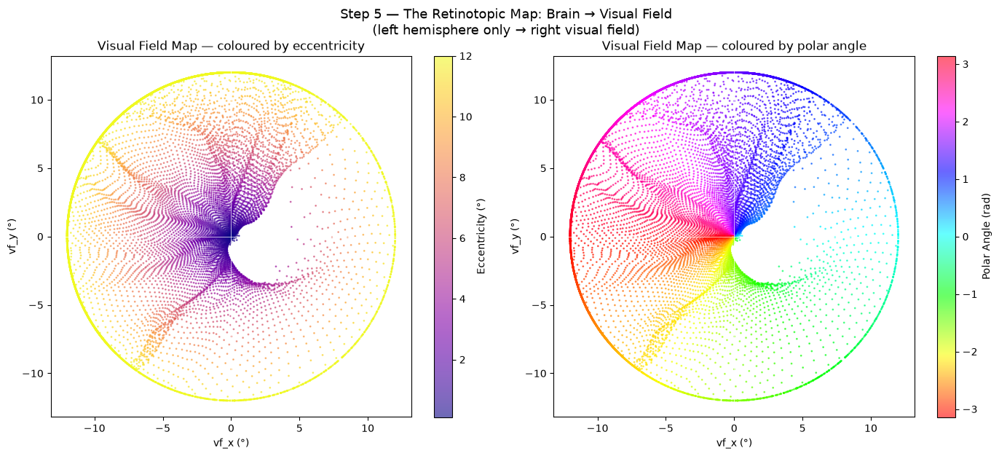

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Left: visual field map coloured by eccentricity
sc = axes[0].scatter(vf_pos[:,0], vf_pos[:,1], c=ecc, cmap='plasma',
                     s=1, alpha=0.6, rasterized=True)
plt.colorbar(sc, ax=axes[0], label='Eccentricity (°)')
axes[0].set_title('Visual Field Map — coloured by eccentricity')
axes[0].set_xlabel('vf_x (°)'); axes[0].set_ylabel('vf_y (°)')
axes[0].set_aspect('equal'); axes[0].axhline(0, color='white', lw=0.5); axes[0].axvline(0, color='white', lw=0.5)

# Right: visual field map coloured by polar angle
sc2 = axes[1].scatter(vf_pos[:,0], vf_pos[:,1], c=pol, cmap='hsv',
                      s=1, alpha=0.6, rasterized=True, vmin=-np.pi, vmax=np.pi)
plt.colorbar(sc2, ax=axes[1], label='Polar Angle (rad)')
axes[1].set_title('Visual Field Map — coloured by polar angle')
axes[1].set_xlabel('vf_x (°)'); axes[1].set_ylabel('vf_y (°)')
axes[1].set_aspect('equal'); axes[1].axhline(0, color='white', lw=0.5); axes[1].axvline(0, color='white', lw=0.5)

fig.suptitle('Step 5 — The Retinotopic Map: Brain → Visual Field\n(left hemisphere only → right visual field)', fontsize=13)
plt.tight_layout()
plt.show()

---
## Step 6 — pRF Simulation

We simulate **100 random stimuli** in the visual field.  
Each node responds to each stimulus via a Gaussian tuning curve:

The result is the synthetic **fMRI signal** — how strongly each node responds to each stimulus.


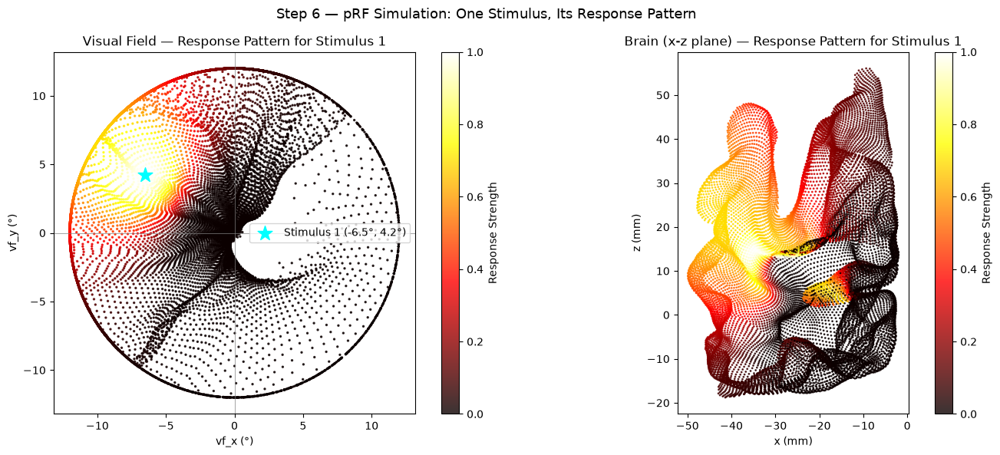

In [9]:
# Simulate one stimulus and show the response pattern
rng     = np.random.default_rng(42)
S       = 100
stim_ecc = rng.uniform(0.0, 10.0, S)
stim_ang = rng.uniform(-np.pi, np.pi, S)
stim_x   = stim_ecc * np.cos(stim_ang)
stim_y   = stim_ecc * np.sin(stim_ang)

# Visualise stimulus #0
s       = 0
sigma   = 0.2 + 0.4 * ecc
dist_vf = np.sqrt((vf_pos[:,0] - stim_x[s])**2 + (vf_pos[:,1] - stim_y[s])**2)
resp_s  = np.exp(-0.5 * (dist_vf / sigma)**2)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Left: visual field with stimulus position
sc = axes[0].scatter(vf_pos[:,0], vf_pos[:,1], c=resp_s, cmap='hot',
                     s=2, alpha=0.8, rasterized=True, vmin=0, vmax=1)
axes[0].scatter([stim_x[s]], [stim_y[s]], c='cyan', s=200, marker='*',
                zorder=5, label=f'Stimulus {s+1} ({stim_x[s]:.1f}°, {stim_y[s]:.1f}°)')
plt.colorbar(sc, ax=axes[0], label='Response Strength')
axes[0].set_title('Visual Field — Response Pattern for Stimulus 1')
axes[0].set_xlabel('vf_x (°)'); axes[0].set_ylabel('vf_y (°)')
axes[0].set_aspect('equal'); axes[0].legend()
axes[0].axhline(0, color='gray', lw=0.5); axes[0].axvline(0, color='gray', lw=0.5)

# Right: response pattern on the brain
# (2D projection: x vs z — axes that correspond to the visual field)
sc2 = axes[1].scatter(pos[:,0], pos[:,2], c=resp_s, cmap='hot',
                      s=1, alpha=0.8, rasterized=True, vmin=0, vmax=1)
plt.colorbar(sc2, ax=axes[1], label='Response Strength')
axes[1].set_title('Brain (x-z plane) — Response Pattern for Stimulus 1')
axes[1].set_xlabel('x (mm)'); axes[1].set_ylabel('z (mm)')
axes[1].set_aspect('equal')

fig.suptitle('Step 6 — pRF Simulation: One Stimulus, Its Response Pattern', fontsize=13)
plt.tight_layout()
plt.show()

---
## Step 7 — data.x: The GNN Input Signal

After 100 stimuli, each node has **100 response values** — one per stimulus.  
This gives the matrix  with shape **(17263, 100)**.  
Each row = one node. Each column = one stimulus.

This is the **only input the GNN sees**.  
**Eccentricity and polar angle are not included** — the network must predict them.


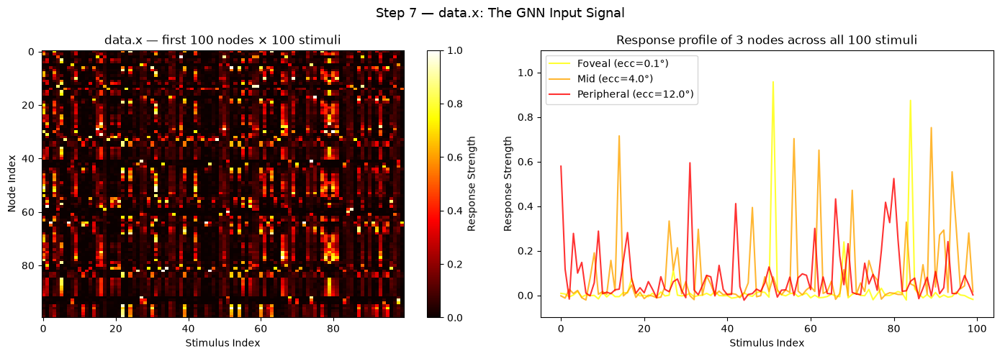

data.x shape: (17263, 100)
The network receives 100 values per node and must predict 2 values (eccentricity, polar angle).


In [10]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Left: heatmap of first 100 nodes × 100 stimuli
im = axes[0].imshow(responses[:100, :], aspect='auto', cmap='hot',
                    vmin=0, vmax=1, interpolation='nearest')
plt.colorbar(im, ax=axes[0], label='Response Strength')
axes[0].set_title('data.x — first 100 nodes × 100 stimuli')
axes[0].set_xlabel('Stimulus Index'); axes[0].set_ylabel('Node Index')

# Right: response profile of 3 nodes
# Foveal node (small eccentricity)
foveal_node = np.argmin(ecc)
mid_node    = np.argmin(np.abs(ecc - 4.0))
peri_node   = np.argmax(ecc)

axes[1].plot(responses[foveal_node, :], alpha=0.8, label=f'Foveal (ecc={ecc[foveal_node]:.1f}°)', color='yellow')
axes[1].plot(responses[mid_node, :],    alpha=0.8, label=f'Mid (ecc={ecc[mid_node]:.1f}°)',   color='orange')
axes[1].plot(responses[peri_node, :],   alpha=0.8, label=f'Peripheral (ecc={ecc[peri_node]:.1f}°)', color='red')
axes[1].set_title('Response profile of 3 nodes across all 100 stimuli')
axes[1].set_xlabel('Stimulus Index'); axes[1].set_ylabel('Response Strength')
axes[1].legend(); axes[1].set_ylim(-0.1, 1.1)

fig.suptitle('Step 7 — data.x: The GNN Input Signal', fontsize=13)
plt.tight_layout()
plt.show()

print(f"data.x shape: {responses.shape}")
print(f"The network receives {responses.shape[1]} values per node and must predict 2 values (eccentricity, polar angle).")

---
## Step 8 — Edge Weights: Euclidean vs. Hyperbolic

Each edge between two neighbouring nodes has a weight — the distance in mm.  
We test different curvature parameters **κ**:

**κ=0** → Euclidean (no change)  
**κ>0** → large distances are compressed more than small ones.  
Note: edges are short (0.2–1.6mm), so the effect is subtle in the local range.


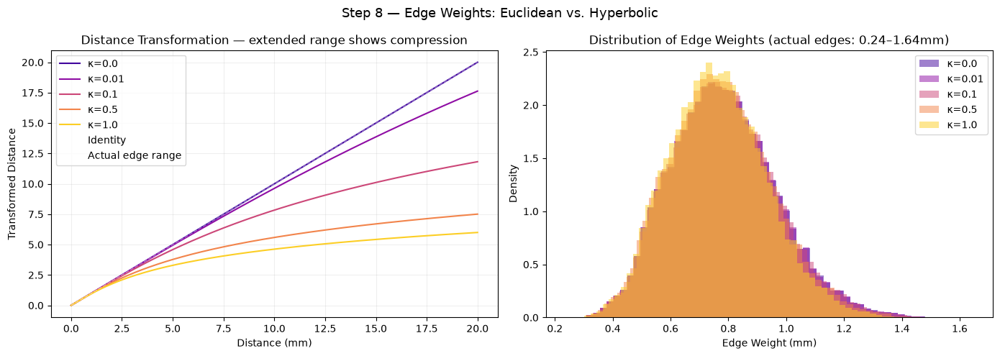

Note: edges are short (0.24–1.64mm), so κ compression is subtle in this range.
The transformation has more visible effect on longer geodesic distances (up to 77mm).


In [11]:
def hyperbolic_weights(distances, kappa):
    if kappa == 0.0:
        return distances.copy()
    sq = np.sqrt(kappa)
    return (2.0 / sq) * np.arcsinh((sq / 2.0) * distances)

kappas  = [0.0, 0.01, 0.1, 0.5, 1.0]
d_range = np.linspace(0, 20, 500)  # extend to 20mm to make effect visible

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Left: transformation curves — extended range to show compression effect
colors = plt.cm.plasma(np.linspace(0.1, 0.9, len(kappas)))
for kappa, color in zip(kappas, colors):
    d_hyp = hyperbolic_weights(d_range, kappa)
    axes[0].plot(d_range, d_hyp, label=f'κ={kappa}', color=color)
axes[0].plot(d_range, d_range, 'w--', lw=1, alpha=0.4, label='Identity')
axes[0].axvspan(0, 1.64, alpha=0.08, color='white', label='Actual edge range')
axes[0].set_xlabel('Distance (mm)'); axes[0].set_ylabel('Transformed Distance')
axes[0].set_title('Distance Transformation — extended range shows compression')
axes[0].legend(); axes[0].grid(alpha=0.2)

# Right: histogram of actual edge weights for each kappa
for kappa, color in zip(kappas, colors):
    w_hyp = hyperbolic_weights(edge_attr[:edge_index.shape[1]//2], kappa)
    axes[1].hist(w_hyp, bins=60, alpha=0.5, label=f'κ={kappa}', color=color, density=True)
axes[1].set_xlabel('Edge Weight (mm)'); axes[1].set_ylabel('Density')
axes[1].set_title('Distribution of Edge Weights (actual edges: 0.24–1.64mm)')
axes[1].legend()

fig.suptitle('Step 8 — Edge Weights: Euclidean vs. Hyperbolic', fontsize=13)
plt.tight_layout()
plt.show()

print('Note: edges are short (0.24–1.64mm), so κ compression is subtle in this range.')
print('The transformation has more visible effect on longer geodesic distances (up to 77mm).')


---
## Step 9 — What Does the GNN Receive?

Summary: the GNN receives all of this at once:

| Field | Shape | Content |
|-------|-------|---------|
|  | (17263, 100) | pRF responses — the signal |
|  | (2, 102432) | Which nodes are connected |
|  | (102432,) | Edge weights (Euclidean or hyperbolic) |
|  | (102432, 2) | Visual field vectors per edge |

It must predict:

| Field | Shape | Content |
|-------|-------|---------|
|  | (17263, 2) | [eccentricity°, polar angle rad] |


In [12]:
# Summary of file contents
print("=== retinotopy_groundtruth.pt ===")
print(f"  data.x            {tuple(data.x.shape)}   — pRF signal (GNN input)")
print(f"  data.edge_index   {tuple(data.edge_index.shape)}  — graph connectivity")
print(f"  data.edge_attr    {tuple(data.edge_attr.shape)}  — Euclidean edge weights")
print(f"  data.edge_pseudo  {tuple(data.edge_pseudo.shape)} — visual field vectors per edge")
print(f"  data.pos          {tuple(data.pos.shape)}  — 3D brain coordinates")
print(f"  data.vf_pos       {tuple(data.vf_pos.shape)}  — 2D visual field coordinates")
print(f"  data.y            {tuple(data.y.shape)}   — targets: [eccentricity, polar angle]")
print(f"  train_mask        {data.train_mask.sum().item():,} nodes (70%)")
print(f"  val_mask          {data.val_mask.sum().item():,} nodes (15%)")
print(f"  test_mask         {data.test_mask.sum().item():,} nodes (15%)")

=== retinotopy_groundtruth.pt ===
  data.x            (17263, 100)   — pRF signal (GNN input)
  data.edge_index   (2, 102432)  — graph connectivity
  data.edge_attr    (102432,)  — Euclidean edge weights
  data.edge_pseudo  (102432, 2) — visual field vectors per edge
  data.pos          (17263, 3)  — 3D brain coordinates
  data.vf_pos       (17263, 2)  — 2D visual field coordinates
  data.y            (17263, 2)   — targets: [eccentricity, polar angle]
  train_mask        12,084 nodes (70%)
  val_mask          2,589 nodes (15%)
  test_mask         2,590 nodes (15%)
